In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader

from torchvision import datasets, transforms as tr

from PIL import Image
from torchvision.transforms.functional import to_pil_image

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

plt.style.use('dark_background')

from tqdm.auto import tqdm, trange

import os
import sys
import requests
import cv2

from dataclasses import dataclass

# 1. Подготовка данных

## 1.1 Выбор и скачивание датасета

Dataset 'cezanne2photo'
Loading zip file...--2025-04-20 16:54:14--  http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/cezanne2photo.zip
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 279885071 (267M) [application/zip]
Saving to: ‘datasets/img2img/cezanne2photo.zip’

datasets/img2img/ce 100%[===================>] 266.92M  5.14MB/s    in 60s     

2025-04-20 16:55:14 (4.46 MB/s) - ‘datasets/img2img/cezanne2photo.zip’ saved [279885071/279885071]

 --> done!
Unziping... --> done!
Provided splits: ['trainA', 'testB', 'testA', 'trainB']
Split 'testA' of dataset 'cezanne2photo' --> size: 58


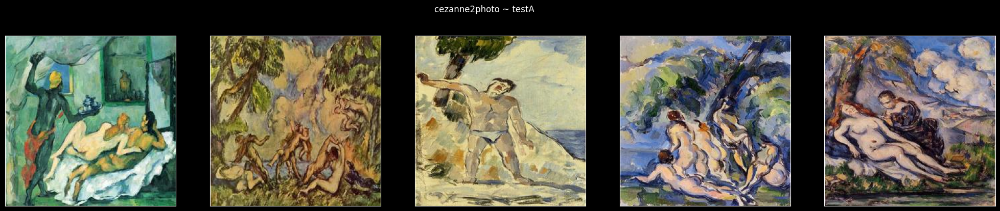

Split 'testB' of dataset 'cezanne2photo' --> size: 751


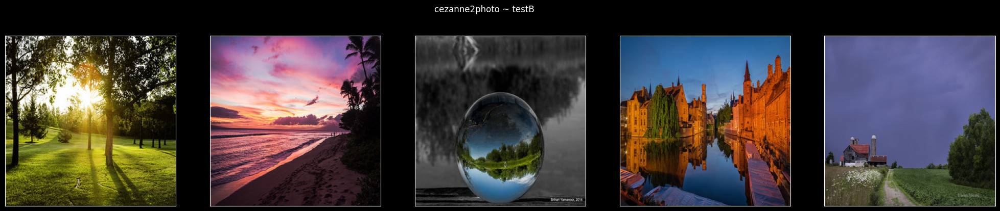

Split 'trainA' of dataset 'cezanne2photo' --> size: 525


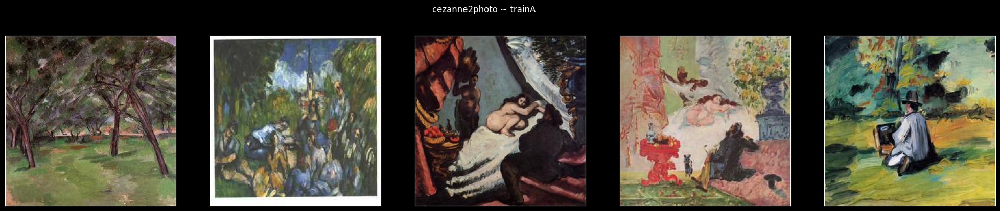

Split 'trainB' of dataset 'cezanne2photo' --> size: 6287


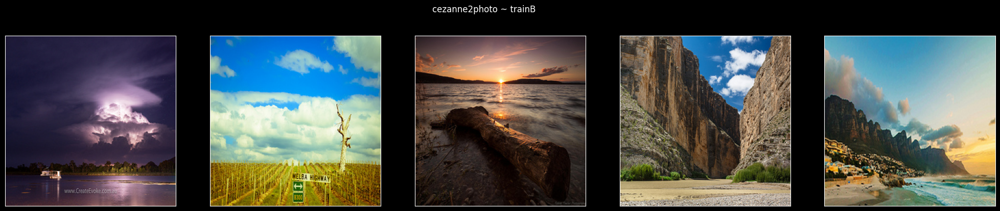


----------------------------



In [2]:
dataset_folder = "datasets/img2img"
num_images_per_split = 5

os.environ["dataset_folder"] = dataset_folder
!mkdir -p "{dataset_folder}"

# В этом цикле каждый из предложенных датасетов
#  - скачивается
#  - распаковывается
#  - отрисовывается + meta
#  - удаляется

# Предлагается посмотреть на все предложенные варианты датасетов и затем оставить один,
#  с которым захочется работать больше всего - закомментируйте (или удалите) все, кроме
#  выбранного, а так же закомментируйте строчки с удалением скачанного датасета
for dataset_name in [
    # Unpaired
    # "apple2orange",
    # "summer2winter_yosemite",
    # "horse2zebra",
    # "monet2photo",
    "cezanne2photo",
    # "ukiyoe2photo",
    # "vangogh2photo",
    # Paired
    # "maps",
    # "facades",
]:
    print(f"Dataset '{dataset_name}'")
    url = f"http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/{dataset_name}.zip"
    download_path = os.path.join(dataset_folder, f"{dataset_name}.zip")
    target_folder = os.path.join(dataset_folder, dataset_name)

    # Чтобы bash вызовы знали соответствующие переменные
    os.environ["url"] = url
    os.environ["download_path"] = download_path
    os.environ["target_folder"] = target_folder

    print("Loading zip file...", end="")
    if not os.path.isfile(download_path) or os.path.exists(target_folder):
        # Можно загрузить через wget
        !wget "{url}" -O "{download_path}"
    print(" --> done!")

    print("Unziping...", end="")
    if os.path.exists(target_folder):
        !rm -r "{target_folder}"
    !mkdir -p "{dataset_folder}"
    !unzip -qq "{download_path}" -d "{dataset_folder}"
    print(" --> done!")

    # Удаляем zip-файл
    !rm "{download_path}"

    # Meta + Отрисовка
    print(f"Provided splits: {os.listdir(target_folder)}")
    dataset = datasets.ImageFolder(target_folder)

    inds_to_show = {i: [] for i, _ in enumerate(dataset.classes)}
    classes_full = 0
    for dataset_ind in range(len(dataset)):
        _, split_ind = dataset[dataset_ind]
        if len(inds_to_show[split_ind]) == num_images_per_split:
            continue
        inds_to_show[split_ind].append(dataset_ind)
        if len(inds_to_show[split_ind]) == num_images_per_split:
            classes_full += 1
        if classes_full == len(dataset.classes):
            break

    for split_name in sorted(dataset.classes):
        split_ind = dataset.class_to_idx[split_name]
        print(f"Split '{split_name}' of dataset '{dataset_name}'", end="")
        split_folder = os.path.join(target_folder, split_name)
        print(f" --> size: {len(os.listdir(split_folder))}")

        plt.subplots(1, num_images_per_split, figsize=(5 * num_images_per_split, 5))
        plt.suptitle(f"{dataset_name} ~ {split_name}", y=0.95)
        for i, dataset_ind in enumerate(inds_to_show[split_ind]):
            plt.subplot(1, num_images_per_split, i + 1)
            plt.imshow(dataset[dataset_ind][0])
            plt.xticks([])
            plt.yticks([])
        plt.show()

    # Удаляем скачанный датасет
    # !rm -r "{target_folder}"

    print("\n----------------------------\n")


## 1.2 Dataset и Transforms

In [3]:
from pathlib import Path

# Выбранный выше и скачанный датасет
dataset_folder = "datasets/img2img"
dataset_name = "cezanne2photo"
target_folder = os.path.join(dataset_folder, dataset_name)

# Класс для датасета изображений без лэйблов с применением трансформов
class ImageDatasetNoLabel(Dataset):

    def __init__(self, imgs_path, transforms=None):
        super(ImageDatasetNoLabel).__init__()

        self.imgs = []
        for img_path in Path(imgs_path).glob("*.jpg"):
            img = cv2.imread(img_path)[:, :, ::-1]
            self.imgs.append(img)

        self.transforms = transforms


    def __getitem__(self, index):
        img = self.imgs[index]
        if isinstance(img, np.ndarray):
            img = img.copy()
        if self.transforms is not None:
            img = self.transforms(img)
        return img


    def __len__(self):
        return len(self.imgs)

# Удобный класс для хранения всех наших датасетов
@dataclass
class DatasetsClass:
    train_a: ImageDatasetNoLabel
    train_b: ImageDatasetNoLabel
    test_a: ImageDatasetNoLabel
    test_b: ImageDatasetNoLabel


# Все датасеты без трансформов - чтобы посчитать статистики
ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(os.path.join(target_folder, "trainA")),
    train_b=ImageDatasetNoLabel(os.path.join(target_folder, "trainB")),
    test_a=ImageDatasetNoLabel(os.path.join(target_folder, "testA")),
    test_b=ImageDatasetNoLabel(os.path.join(target_folder, "testB")),
)

In [4]:
def get_channel_statistics(dataset):
    """
    Функция для получения поканальных статистик (среднее и отклонение) по датасету
    """

    n = len(dataset)
    n = len(dataset)
    h, w, c = dataset.imgs[0].shape
    total_pixels = n * h * w

    channel_mean = np.zeros(c)
    sum_sq = np.zeros(c)

    for i in range(n):
        img_mean = np.mean(dataset.imgs[i] / 255., axis=(0, 1))
        channel_mean += img_mean
        sum_sq += np.sum((dataset.imgs[i] / 255.) ** 2, axis=(0, 1))

    channel_mean /= n
    channel_std = np.sqrt(sum_sq / total_pixels - channel_mean ** 2)

    return channel_mean, channel_std


# Поканальное среднее и отклонение для A
channel_mean_a, channel_std_a = get_channel_statistics(ds.train_a)
print(channel_mean_a, channel_std_a)

# Поканальное среднее и отклонение для B
channel_mean_b, channel_std_b = get_channel_statistics(ds.train_b)
print(channel_mean_b, channel_std_b)

[0.46209964 0.42545454 0.34544637] [0.25900753 0.24354563 0.2283074 ]
[0.41229027 0.40928956 0.39267376] [0.27109754 0.24869304 0.27782148]


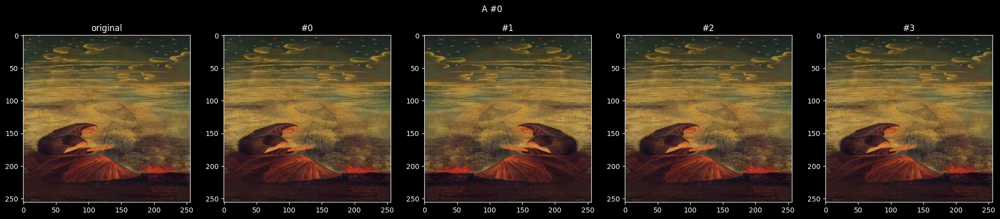

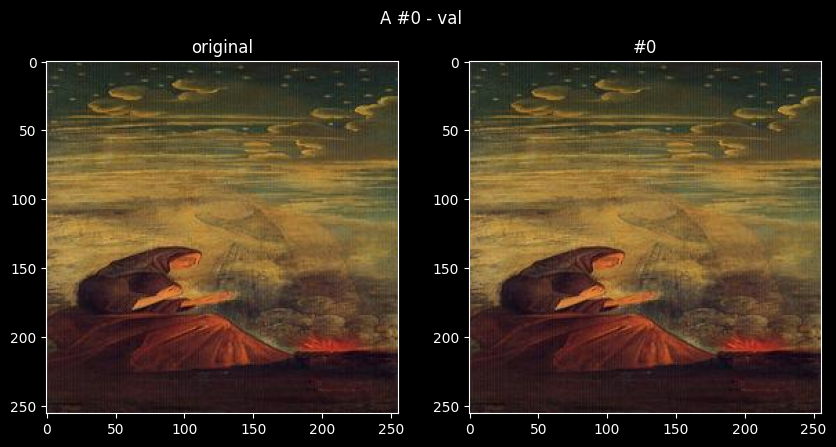

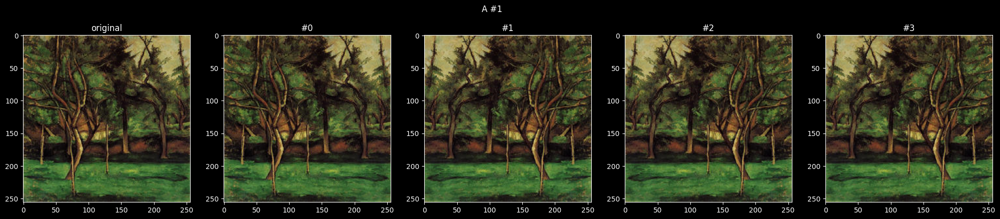

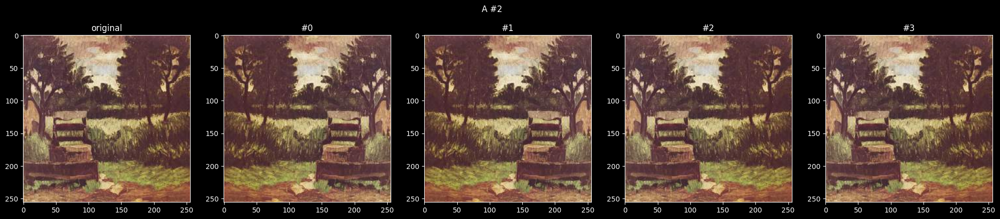

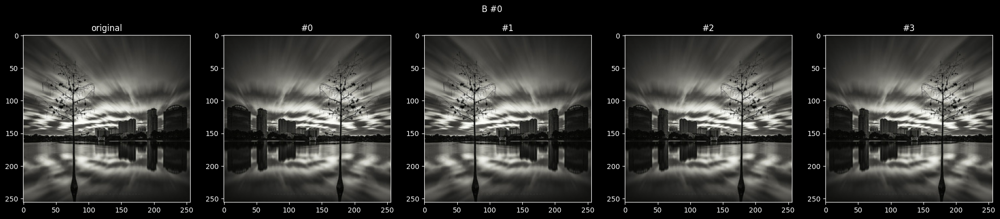

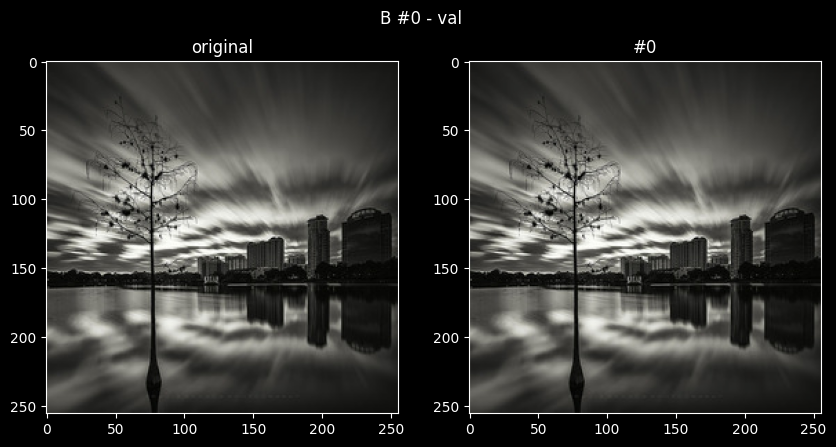

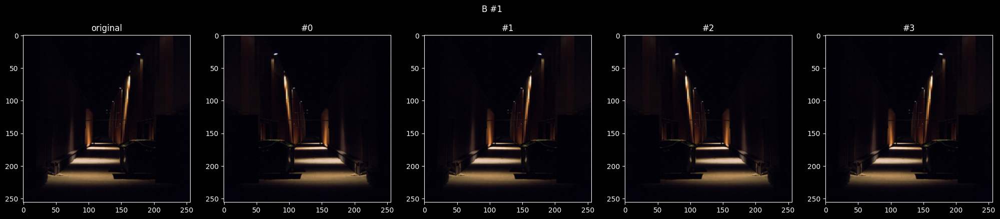

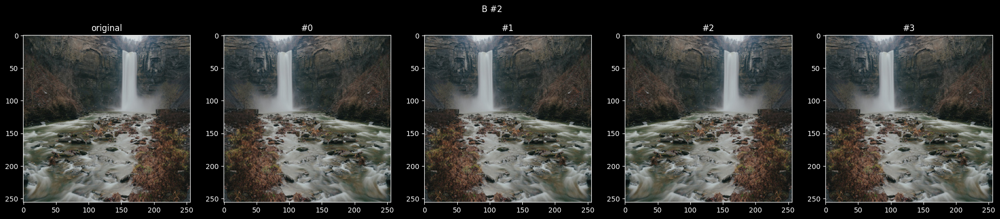

In [5]:
# Функция для получения train и val transform-ов, а так же функции для де-нормализации изображения
def get_transforms(mean, std, normalize=True):

    train_transform = tr.Compose([
        tr.ToPILImage(),
        tr.RandomHorizontalFlip(),
        tr.ToTensor(),
        *([tr.Normalize(mean=mean, std=std)] if normalize else []),
    ])

    val_transform = tr.Compose([
        tr.ToTensor(),
        *([tr.Normalize(mean=mean, std=std)] if normalize else []),
    ])

    def de_normalize(img, normalized=normalize):
        # print(img.shape)
        img = img.detach().cpu().numpy().transpose((1, 2, 0))
        if normalized:
            return mean + img * std
            # return Image.fromarray(mean + img * std)
        else:
            return img
            # return Image.fromarray(img)

    return train_transform, val_transform, de_normalize


# Ваши гиперпараметры
hyperparams = dict(
    normalize=True
)
# transform-ы для A и B
train_transform_a, val_transform_a, de_normalize_a = get_transforms(channel_mean_a, channel_std_a, **hyperparams)
train_transform_b, val_transform_b, de_normalize_b = get_transforms(channel_mean_b, channel_std_b, **hyperparams)


# Функция для визуализации transform-ов
def show_examples(dataset, transform, de_norm, num_per_image=3, image_index=0, title=""):
    fig, ax = plt.subplots(1, 1 + num_per_image, figsize=(5 * (1 + num_per_image), 5))

    image = dataset[image_index]
    # image = Image.fromarray(dataset[image_index])

    plt.suptitle(title, y=0.95)

    plt.subplot(1, 1 + num_per_image, 1)
    # plt.imshow(image.detach().cpu().numpy().transpose((1, 2, 0)))
    plt.imshow(image)
    plt.title("original")

    for i in range(num_per_image):
        plt.subplot(1, 1 + num_per_image, i + 2)
        plt.title(f"#{i}")
        # plt.imshow(np.clip(de_norm(image), 0, 1))
        plt.imshow(np.clip(de_norm(transform(image)), 0, 1))
    plt.show()

# Проверка на адекватность
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=0, title="A #0")
show_examples(ds.train_a, val_transform_a, de_normalize_a, num_per_image=1, image_index=0, title="A #0 - val")
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=1, title="A #1")
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=2, title="A #2")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=0, title="B #0")
show_examples(ds.train_b, val_transform_b, de_normalize_b, num_per_image=1, image_index=0, title="B #0 - val")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=1, title="B #1")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=2, title="B #2")

In [6]:
# Все датасеты с трансформами
ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(
        os.path.join(target_folder, "trainA"),
        transforms=train_transform_a,
    ),
    train_b=ImageDatasetNoLabel(
        os.path.join(target_folder, "trainB"),
        transforms=val_transform_b,
    ),
    test_a=ImageDatasetNoLabel(
        os.path.join(target_folder, "testA"),
        transforms=val_transform_a,
    ),
    test_b=ImageDatasetNoLabel(
        os.path.join(target_folder, "testB"),
        transforms=val_transform_b,
    ),
)

## 1.3 DataLoader

In [7]:
@dataclass
class DataLoadersClass:
    train_a: DataLoader
    train_b: DataLoader
    test_a: DataLoader
    test_b: DataLoader

batch_size = 3

dataloaders = DataLoadersClass(
    train_a=DataLoader(
        dataset=ds.train_a,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
    ),
    train_b=DataLoader(
        dataset=ds.train_b,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
    ),
    test_a=DataLoader(
        dataset=ds.test_a,
        batch_size=batch_size,
        shuffle=False,
        drop_last=True,
    ),
    test_b=DataLoader(
        dataset=ds.test_b,
        batch_size=batch_size,
        shuffle=False,
        drop_last=True,
    ),
)

# 2. Модель

## 2.0 Вспомогательные модули и классы

In [8]:
from collections import OrderedDict
from functools import partial

class ResidualBlock(nn.Module):
    def __init__(self, c_in, c_out, kernel_size, n_layers, activation_class=nn.ReLU, dropout_p=0.3, reverse=False, do_scale=True, change_size=0):
        super(ResidualBlock, self).__init__()

        self.c_in = c_in
        self.c_out = c_out
        self.kernel_size = kernel_size
        self.n_layers = n_layers
        self.activation_class = activation_class
        self.dropout_p = dropout_p
        self.reverse = reverse
        self.do_scale = do_scale
        self.change_size = change_size

        if self.reverse:
            self.conv_class = nn.ConvTranspose2d
            self.scale_class = partial(
                nn.ConvTranspose2d,
                in_channels=self.c_out,
                out_channels=self.c_out,
                stride=2,
            )
            self.conv_name_prefix = "deconv"
            self.scale_name = "upscale"
            self.change_name = "add_size"
        else:
            self.conv_class = nn.Conv2d
            self.scale_class = nn.MaxPool2d
            self.conv_name_prefix = "conv"
            self.scale_name = "downscale"
            self.change_name = "sub_size"

        layers = []
        for i in range(n_layers):
            seq = OrderedDict()

            if kernel_size % 2 == 0:
                p = kernel_size // 2
                pad = (p - 1, p, p - 1, p)
                seq['pad'] = nn.ConstantPad2d(pad, 0)
                padding = 0
            else:
                padding = kernel_size // 2

            conv_layer = self.conv_class(
                in_channels=c_in if i == 0 else c_out,
                out_channels=c_out,
                kernel_size=kernel_size,
                padding=padding,
                bias=False
            )

            seq[self.conv_name_prefix] = conv_layer
            seq['bnorm'] = nn.BatchNorm2d(c_out)
            seq['act'] = activation_class()
            seq['drop'] = nn.Dropout2d(dropout_p)

            layers.append(nn.Sequential(seq))

        self.layers = nn.Sequential(OrderedDict([(f"layer_{i}", layer) for i, layer in enumerate(layers)]))

        self.adapt_residual = nn.Identity() if self.c_in == self.c_out else self.conv_class(self.c_in, self.c_out, 1)

        scale = [
            (self.change_name, self.conv_class(self.c_out, self.c_out, self.change_size + 1) if self.change_size > 0 else nn.Identity()),
            (self.scale_name, self.scale_class(kernel_size=2) if self.do_scale else nn.Identity()),
        ]
        self.scale = nn.Sequential(OrderedDict(scale))


    def forward(self, x):
        y = self.scale(self.layers(x) + self.adapt_residual(x))
        return y

In [9]:
class Encoder(nn.Module):
    def __init__(self, num_blocks, block_sizes, hidden_sizes, kernel_sizes, activation_classes, use_scales, change_sizes, dropout_ps, fc_size=0):
        super(Encoder, self).__init__()

        def fill_list(val, size):
            if isinstance(val, list):
                assert len(val) == size
                return val
            return [val for _ in range(size)]

        self.num_blocks = num_blocks
        self.block_sizes = fill_list(block_sizes, self.num_blocks)
        self.hidden_sizes = [3] + fill_list(hidden_sizes, self.num_blocks)
        self.kernel_sizes = fill_list(kernel_sizes, self.num_blocks)
        self.activation_classes = fill_list(activation_classes, self.num_blocks)
        self.use_scales = fill_list(use_scales, self.num_blocks)
        self.change_sizes = fill_list(change_sizes, self.num_blocks)
        self.dropout_ps = fill_list(dropout_ps, self.num_blocks)
        self.fc_size = fc_size

        self.residual_blocks = nn.Sequential(OrderedDict([
            (
                f"residual_{i}",
                ResidualBlock(
                    c_in=self.hidden_sizes[i],
                    c_out=self.hidden_sizes[i+1],
                    kernel_size=self.kernel_sizes[i],
                    n_layers=self.block_sizes[i],
                    activation_class=self.activation_classes[i],
                    dropout_p=self.dropout_ps[i],
                    do_scale=self.use_scales[i],
                    change_size=self.change_sizes[i],
                    reverse=False,
                ),
            ) for i in range(self.num_blocks)
        ]))

        self.global_pool = nn.AdaptiveAvgPool2d(output_size=(1, 1)) if self.fc_size > 0 else nn.Identity()
        self.fc = nn.Linear(self.hidden_sizes[-1], self.fc_size) if self.fc_size > 0 else nn.Identity()

    def forward(self, x):
        out = self.residual_blocks(x)
        out = self.global_pool(out)
        if self.fc_size > 0:
            out = out.squeeze(-1).squeeze(-1)
        return self.fc(out)

In [10]:
class Decoder(nn.Module):
    def __init__(self, num_blocks, block_sizes, hidden_sizes, kernel_sizes, activation_classes, use_scales, change_sizes, dropout_ps):
        super(Decoder, self).__init__()

        def fill_list(val, size):
            if isinstance(val, list):
                assert len(val) == size
                return val
            return [val for _ in range(size)]

        self.num_blocks = num_blocks
        self.block_sizes = fill_list(block_sizes, self.num_blocks)
        self.hidden_sizes = fill_list(hidden_sizes, self.num_blocks + 1)
        self.kernel_sizes = fill_list(kernel_sizes, self.num_blocks)
        self.activation_classes = fill_list(activation_classes, self.num_blocks)
        self.use_scales = fill_list(use_scales, self.num_blocks)
        self.change_sizes = fill_list(change_sizes, self.num_blocks)
        self.dropout_ps = fill_list(dropout_ps, self.num_blocks)

        self.residual_blocks = nn.Sequential(OrderedDict([
            (
                f"residual_{i}",
                ResidualBlock(
                    c_in=self.hidden_sizes[i],
                    c_out=self.hidden_sizes[i+1],
                    kernel_size=self.kernel_sizes[i],
                    n_layers=self.block_sizes[i],
                    activation_class=self.activation_classes[i],
                    dropout_p=self.dropout_ps[i],
                    do_scale=self.use_scales[i],
                    change_size=self.change_sizes[i],
                    reverse=True,
                ),
            ) for i in range(self.num_blocks)
        ]))

    def forward(self, x):
        return self.residual_blocks(x)

In [11]:
class Generator(nn.Module):

    def __init__(self, enc_params, dec_params):

        super(Generator, self).__init__()
        self.encoder = Encoder(
            **enc_params
        )
        self.decoder = Decoder(
            **dec_params
        )

    def forward(self, x):
        z = self.encoder(x)
        if len(z.shape) == 2:
            z = z[:, :, None, None]
        return self.decoder(z)


## 2.1 Архитектура сети

In [12]:
class CycleGAN(nn.Module):

    def __init__(self, z_size, discr_params, gen_enc_params, gen_dec_params):
        super(CycleGAN, self).__init__()

        self.z_size = z_size
        self.hw_z = int(np.sqrt(self.z_size))
        assert self.hw_z ** 2 == self.z_size

        self.generator_a2b = Generator(
            gen_enc_params,
            gen_dec_params,
        )
        self.generator_b2a = Generator(
            gen_enc_params,
            gen_dec_params,
        )

        self.discriminator_a = Encoder(
            **discr_params,
        )

        self.discriminator_b = Encoder(
            **discr_params,
        )

    def generate_samples(self, x, domain: str):

        n = x.shape[0]

        if domain == 'a2b':
            return F.sigmoid(self.generator_a2b(x))
        else:
            return F.sigmoid(self.generator_b2a(x))


## 2.2 Loss

$$ \mathbf{L}_{\text{cyc}} \big( G_{A \rightarrow B}, G_{B \rightarrow A} \big) = \mathbb{E}_{a \sim A} \bigg( \Big\| G_{B \rightarrow A} \big( G_{A \rightarrow B} ( a ) \big) - a \Big\|_1 \bigg) + \mathbb{E}_{b \sim B} \bigg( \Big\| G_{A \rightarrow B} \big( G_{B \rightarrow A} ( b ) \big) - b \Big\|_1 \bigg) \longrightarrow \min_{G}$$

In [13]:
class CycleConsistencyLoss(nn.Module):
    """
    Функция ошибки, проверяющая что после двойного перехода через генераторы изображение не изменилось
    """
    def __init__(self):
        super(CycleConsistencyLoss, self).__init__()


    def forward(self, x, x_rec):
        # Принимает на вход оригинальное изображение и изображение после двойного перехода
        return torch.mean(torch.sum(torch.abs(x - x_rec), axis=(1, 2, 3)))


$$ \mathbf{L}_{\text{GAN}} \big( G_{A \rightarrow B}, D_{B} \big) = \mathbb{E}_{b \sim B} \log D_{B} (b) + \mathbb{E}_{a \sim A} \log \Big( 1 - D_{B} \big( G_{A \rightarrow B} (a) \big) \Big) \longrightarrow \min_{G} \max_{D}$$

In [14]:
class AdversarialLossCE(nn.Module):
    """
    Стандартная функция ошибки для minmax игры GAN-ов
    """
    def __init__(self):
        super(AdversarialLossCE, self).__init__()

    def forward(self, real_pred, fake_pred=None):
        # Принимает на вход D_{A}(a) - real_pred и D_{A}(G(b)) - fake_pred или наоборот
        # Может принимать только один аргумент для удобности использования в случае
        #  обучения или генератора, или дискриминатора
        if fake_pred is not None:
            return - torch.mean(torch.log(real_pred)) - torch.mean(torch.log(1 - fake_pred))
        else:
            return torch.mean(torch.log(1 - real_pred))


$$ \mathbb{E}_{b \sim B} \big( D_{B} (b) - 1 \big)^2 + \mathbb{E}_{a \sim A} \Big( D_{B} \big( G_{A \rightarrow B} (a) \big) \Big)^2 \longrightarrow \min_{D} $$
$$ \mathbb{E}_{a \sim A} \Big( D_{B} \big( G_{A \rightarrow B} (a) \big) - 1 \Big)^2 \longrightarrow \min_{G} $$

In [15]:
class AdversarialLossMSE(nn.Module):
    """
    Можно переписать не через CE, а через MSE loss на одном предсказании, помогает со стабильностью
    """
    def __init__(self):
        super(AdversarialLossMSE, self).__init__()

    def forward(self, real_pred, fake_pred=None):
        # Принимает на вход D_{A}(a) - real_pred и D_{A}(G(b)) - fake_pred или наоборот
        # Может принимать только один аргумент для удобности использования в случае
        #  обучения или генератора, или дискриминатора
        if fake_pred is not None:
            return torch.mean((real_pred - 1) ** 2) + torch.mean(fake_pred ** 2)
        else:
            return torch.mean((real_pred - 1) ** 2)

$$ \mathbf{L} \big( G_{A \rightarrow B}, G_{B \rightarrow A}, D_{A}, D_{B} \big) = \mathbf{L}_{\text{GAN}} \big( G_{A \rightarrow B}, D_{B} \big) + \mathbf{L}_{\text{GAN}} \big( G_{B \rightarrow A}, D_{A} \big) + \lambda \cdot \mathbf{L}_{\text{cyc}} \big( G_{A \rightarrow B}, G_{B \rightarrow A} \big) \longrightarrow \min_{G} \max_{D}$$

In [16]:
class FullDiscriminatorLoss(nn.Module):
    """
    Полная ошибка для дискриминатора
    """
    def __init__(self, is_mse=True):
        super(FullDiscriminatorLoss, self).__init__()
        self.adversarial_loss_func = AdversarialLossMSE() if is_mse\
            else AdversarialLossCE()

    def forward(
        self,
        real_pred_b,
        fake_pred_b,
        real_pred_a,
        fake_pred_a,
    ):
        return self.adversarial_loss_func(real_pred_b, fake_pred_b)\
            + self.adversarial_loss_func(real_pred_a, fake_pred_a)

In [17]:
class FullGeneratorLoss(nn.Module):
    """
    Полная ошибка для генератора
    """
    def __init__(self, lambda_value=10., is_mse=True):
        super(FullGeneratorLoss, self).__init__()
        self.adversarial_loss_func = AdversarialLossMSE() if is_mse\
            else AdversarialLossCE()
        self.cycle_consistency_loss_func = CycleConsistencyLoss()
        self.lambda_value = lambda_value

    def forward(
        self,
        fake_pred_b,
        fake_pred_a,
        imgs_a,
        imgs_a2b2a,
        imgs_b,
        imgs_b2a2b,
    ):
        return self.adversarial_loss_func(fake_pred_b)\
            + self.adversarial_loss_func(fake_pred_a)\
            + self.lambda_value * (
                self.cycle_consistency_loss_func(imgs_a, imgs_a2b2a)\
                + self.cycle_consistency_loss_func(imgs_b, imgs_b2a2b)
            )

# 3. Подготовка обучения

## 3.1 Шаг обучения дискриминатора

In [18]:
def train_discriminator_step(model, optimizer_d, imgs_a, imgs_b, criterion_d):
    model.train()
    optimizer_d.zero_grad()

    b_real_pred = model.discriminator_b(imgs_b)
    gen_imgs_a2b = model.generator_a2b(imgs_a).detach()
    b_fake_pred = model.discriminator_b(gen_imgs_a2b)

    a_real_pred = model.discriminator_a(imgs_a)
    gen_imgs_b2a = model.generator_b2a(imgs_b).detach()
    a_fake_pred = model.discriminator_a(gen_imgs_b2a)

    is_mse_pred = a_real_pred.shape[-1] == 1
    if is_mse_pred:
        a_real_pred = a_real_pred[:, 0]
        b_real_pred = b_real_pred[:, 0]
        a_fake_pred = a_fake_pred[:, 0]
        b_fake_pred = b_fake_pred[:, 0]
    else:
        a_real_pred = F.softmax(a_real_pred, dim=1)[:, 1]
        b_real_pred = F.softmax(b_real_pred, dim=1)[:, 1]
        a_fake_pred = F.softmax(a_fake_pred, dim=1)[:, 1]
        b_fake_pred = F.softmax(b_fake_pred, dim=1)[:, 1]

    loss_d = criterion_d(b_real_pred, b_fake_pred, a_real_pred, a_fake_pred)

    loss_d.backward()
    optimizer_d.step()

    return loss_d.item()


## 3.2 Шаг обучения генератора

In [19]:
def train_generator_step(model, optimizer_g, imgs_a, imgs_b, criterion_g):
    model.train()
    optimizer_g.zero_grad()

    gen_imgs_a2b = model.generator_a2b(imgs_a)
    b_fake_pred = model.discriminator_b(gen_imgs_a2b)

    gen_imgs_b2a = model.generator_b2a(imgs_b)
    a_fake_pred = model.discriminator_a(gen_imgs_b2a)

    is_mse_pred = a_fake_pred.shape[-1] == 1
    if is_mse_pred:
        a_fake_pred = a_fake_pred[:, 0]
        b_fake_pred = b_fake_pred[:, 0]
    else:
        a_fake_pred = F.softmax(a_fake_pred, dim=1)[:, 1]
        b_fake_pred = F.softmax(b_fake_pred, dim=1)[:, 1]

    # Cycle Consistency
    gen_imgs_a2b2a = model.generator_b2a(gen_imgs_a2b)
    gen_imgs_b2a2b = model.generator_a2b(gen_imgs_b2a)

    loss_g = criterion_g(
        b_fake_pred, a_fake_pred,
        imgs_a, gen_imgs_a2b2a,
        imgs_b, gen_imgs_b2a2b
    )

    loss_g.backward()
    optimizer_g.step()

    return loss_g.item()


## 3.3 Шаг валидации

In [20]:
from collections import defaultdict

def val(model, loader_a, loader_b, criterion_d, criterion_g):
    model.eval()

    val_data = defaultdict(list)

    with torch.no_grad():
        iter_a = iter(loader_a)
        iter_b = iter(loader_b)
        batches_per_epoch = min(len(iter_a), len(iter_b))

        for _ in trange(batches_per_epoch):
            imgs_a = next(iter_a).to(device)
            imgs_b = next(iter_b).to(device)

            a_real_pred = model.discriminator_a(imgs_a)
            gen_imgs_b2a = model.generate_samples(imgs_b, 'b2a')
            a_fake_pred = model.discriminator_a(gen_imgs_b2a)

            b_real_pred = model.discriminator_b(imgs_b)
            gen_imgs_a2b = model.generate_samples(imgs_a, 'a2b')
            b_fake_pred = model.discriminator_b(gen_imgs_a2b)

            is_mse_pred = a_real_pred.shape[-1] == 1

            if is_mse_pred:
                a_real_pred = a_real_pred[:, 0]
                b_real_pred = b_real_pred[:, 0]
                a_fake_pred = a_fake_pred[:, 0]
                b_fake_pred = b_fake_pred[:, 0]
            else:
                a_real_pred = F.softmax(a_real_pred, dim=1)[:, 1]
                b_real_pred = F.softmax(b_real_pred, dim=1)[:, 1]
                a_fake_pred = F.softmax(a_fake_pred, dim=1)[:, 1]
                b_fake_pred = F.softmax(b_fake_pred, dim=1)[:, 1]

            gen_imgs_a2b2a = model.generator_b2a(gen_imgs_a2b)
            gen_imgs_b2a2b = model.generator_a2b(gen_imgs_b2a)

            loss_d = criterion_d(b_real_pred, b_fake_pred, a_real_pred,
                                a_fake_pred)

            loss_g = criterion_g(b_fake_pred, a_fake_pred,
                                imgs_a, gen_imgs_a2b2a,
                                imgs_b, gen_imgs_b2a2b)

            val_data["loss D"].append(loss_d.item())
            val_data["loss G"].append(loss_g.item())

            # Оставлю для вас мой кусочек логирования для визуализации, думаю по аналогии
            #  разберётесь что предполагалось в каких переменных

            val_data["real pred A"].extend(a_real_pred.cpu().detach().tolist())
            val_data["real pred B"].extend(b_real_pred.cpu().detach().tolist())
            val_data["fake pred A"].extend(a_fake_pred.cpu().detach().tolist())
            val_data["fake pred B"].extend(b_fake_pred.cpu().detach().tolist())

        val_data["loss D"] = np.mean(val_data["loss D"])
        val_data["loss G"] = np.mean(val_data["loss G"])

    return val_data

## 3.4 Визуализация сгенерированного

In [21]:
def draw_imgs(model, num_images, loader_a, loader_b, de_norm_a, de_norm_b):
    model.eval()
    with torch.no_grad():
        imgs_a = next(iter(loader_a))[:num_images].to(device)
        imgs_b = next(iter(loader_b))[:num_images].to(device)

        fake_a = model.generate_samples(imgs_b, 'b2a')
        fake_b = model.generate_samples(imgs_a, 'a2b')
        rec_a = model.generator_b2a(fake_b)
        rec_b = model.generator_a2b(fake_a)

        # Draw num_images examples for A
        fig, ax = plt.subplots(num_images, 3, figsize=(25, 15))
        plt.suptitle("Images from A", y=0.92)

        for ind in range(num_images):
            plt.subplot(num_images, 3, ind * 3 + 1)
            plt.title("Original from A")
            plt.imshow(de_norm_a(imgs_a[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

            plt.subplot(num_images, 3, ind * 3 + 2)
            plt.title("Translated to B")
            plt.imshow(de_norm_b(fake_b[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

            plt.subplot(num_images, 3, ind * 3 + 3)
            plt.title("Reconstructed A")
            plt.imshow(de_norm_a(rec_a[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

        # Draw num_images examples for B
        fig, ax = plt.subplots(num_images, 3, figsize=(25, 15))
        plt.suptitle("Images from B", y=0.92)

        for ind in range(num_images):
            plt.subplot(num_images, 3, ind * 3 + 1)
            plt.title("Original from B")
            plt.imshow(de_norm_b(imgs_b[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

            plt.subplot(num_images, 3, ind * 3 + 2)
            plt.title("Translated to A")
            plt.imshow(de_norm_a(fake_a[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

            plt.subplot(num_images, 3, ind * 3 + 3)
            plt.title("Reconstructed B")
            plt.imshow(de_norm_b(rec_b[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

        plt.show()

## 3.5 Цикл обучения

In [22]:
from IPython.display import clear_output
import warnings

def get_model_name(chkp_folder, model_name=None):
    # Выбираем имя чекпоинта для сохранения
    if model_name is None:
        if os.path.exists(chkp_folder):
            num_starts = len(os.listdir(chkp_folder)) + 1
        else:
            num_starts = 1
        model_name = f'model#{num_starts}'
    else:
        if "#" not in model_name:
            model_name += "#0"
    changed = False
    while os.path.exists(os.path.join(chkp_folder, model_name + '.pt')):
        model_name, ind = model_name.split("#")
        model_name += f"#{int(ind) + 1}"
        changed=True
    if changed:
        warnings.warn(f"Selected model_name was used already! To avoid possible overwrite - model_name changed to {model_name}")
    return model_name


def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']



def learning_loop(
    model,
    optimizer_g,
    g_iters_per_epoch,
    optimizer_d,
    d_iters_per_epoch,
    train_loader_a,
    train_loader_b,
    val_loader_a,
    val_loader_b,
    criterion_d,
    criterion_g,
    de_norm_a,
    de_norm_b,
    scheduler_d=None,
    scheduler_g=None,
    min_lr=None,
    epochs=10,
    val_every=1,
    draw_every=1,
    model_name=None,
    chkp_folder="./chkps",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
):
    model_name = get_model_name(chkp_folder, model_name)

    if plots is None:
        plots = {
            'train G': [],
            'train D': [],
            'val D': [],
            'val G': [],
            'lr G': [],
            'lr D': [],
            'hist real A': [],
            'hist gen A': [],
            'hist real B': [],
            'hist gen B': [],
        }

    for epoch in np.arange(1, epochs+1) + starting_epoch:
        print(f'#{epoch}/{epochs}:')

        # Записываем LR
        plots['lr G'].append(get_lr(optimizer_g))
        plots['lr D'].append(get_lr(optimizer_d))

        # Синхронизированные итераторы
        iter_a = iter(train_loader_a)
        iter_b = iter(train_loader_b)
        batches = min(len(train_loader_a), len(train_loader_b))

        epoch_losses_g = []
        epoch_losses_d = []

        # Тренировка G и D в одном цикле
        for _ in trange(batches, desc=f"Epoch {epoch}"):
            imgs_a = next(iter_a).to(device)
            imgs_b = next(iter_b).to(device)

            # Шаги генератора
            for _ in range(g_iters_per_epoch):
                loss_g = train_generator_step(model, optimizer_g, imgs_a, imgs_b, criterion_g)
                epoch_losses_g.append(loss_g)

            # Шаги дискриминатора
            for _ in range(d_iters_per_epoch):
                loss_d = train_discriminator_step(model, optimizer_d, imgs_a, imgs_b, criterion_d)
                epoch_losses_d.append(loss_d)

        # Записываем усреднённые потери за эпоху
        plots['train G'].extend(epoch_losses_g)
        plots['train D'].extend(epoch_losses_d)

        # Валидация
        if not (epoch % val_every):
            print("validate")
            val_data = val(model, val_loader_a, val_loader_b, criterion_d, criterion_g)
            plots['val D'].append(val_data["loss D"])
            plots['val G'].append(val_data["loss G"])
            plots['hist real A'].append(val_data["real pred A"])
            plots['hist gen A'].append(val_data["fake pred A"])
            plots['hist real B'].append(val_data["real pred B"])
            plots['hist gen B'].append(val_data["fake pred B"])

            # Сохраняем чекпоинт
            os.makedirs(chkp_folder, exist_ok=True)
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_d_state_dict': optimizer_d.state_dict(),
                'optimizer_g_state_dict': optimizer_g.state_dict(),
                'scheduler_d_state_dict': scheduler_d.state_dict() if scheduler_d else None,
                'scheduler_g_state_dict': scheduler_g.state_dict() if scheduler_g else None,
                'plots': plots,
            }, os.path.join(chkp_folder, f"{model_name}.pt"))

            # Шедулинг lr
            if scheduler_d:
                try: scheduler_d.step()
                except: scheduler_d.step(np.mean(epoch_losses_d))
            if scheduler_g:
                try: scheduler_g.step()
                except: scheduler_g.step(np.mean(epoch_losses_g))

        # Отображение графиков
        if not (epoch % draw_every):
            clear_output(True)
            fig, axes = plt.subplots(2, 2, figsize=(20, 8))
            fig.suptitle(f'Epoch {epoch}/{epochs}')

            # Потери
            axes[0,0].plot(plots['train G'], 'r.-', label='train G')
            axes[0,0].plot(np.linspace(1, epoch, len(plots['val G'])), plots['val G'], 'g.-', label='val G')
            axes[0,0].set_title('Generator Loss'); axes[0,0].legend()

            axes[0,1].plot(plots['train D'], 'r.-', label='train D')
            axes[0,1].plot(np.linspace(1, epoch, len(plots['val D'])), plots['val D'], 'g.-', label='val D')
            axes[0,1].set_title('Discriminator Loss'); axes[0,1].legend()

            # Гистограммы предсказаний D
            axes[1,0].hist(plots['hist real A'][-1], bins=50, density=True, alpha=0.7, label='real A')
            axes[1,0].hist(plots['hist gen A'][-1], bins=50, density=True, alpha=0.7, label='gen A')
            axes[1,0].set_title('D_A Predictions'); axes[1,0].legend()

            axes[1,1].hist(plots['hist real B'][-1], bins=50, density=True, alpha=0.7, label='real B')
            axes[1,1].hist(plots['hist gen B'][-1], bins=50, density=True, alpha=0.7, label='gen B')
            axes[1,1].set_title('D_B Predictions'); axes[1,1].legend()

            plt.show()

            draw_imgs(model, images_per_validation, val_loader_a, val_loader_b, de_norm_a, de_norm_b)

        # Ранний стоп по lr
        if min_lr and get_lr(optimizer_d) <= min_lr:
            print(f'Early stopping D at epoch {epoch}')
            break
        if min_lr and get_lr(optimizer_g) <= min_lr:
            print(f'Early stopping G at epoch {epoch}')
            break

    return model, optimizer_d, optimizer_g, plots


# 4. Обучение

## 4.1 Инициализация модели и оптимайзера

In [23]:
from collections import defaultdict
from termcolor import colored


def beautiful_int(i):
    i = str(i)
    return ".".join(reversed([i[max(j, 0):j+3] for j in range(len(i) - 3, -3, -3)]))


# Подсчёт числа параметров в нашей модели
def model_num_params(model, verbose_all=True, verbose_only_learnable=False):
    sum_params = 0
    sum_learnable_params = 0
    submodules = defaultdict(lambda : [0, 0])
    for name, param in model.named_parameters():
        num_params = param.numel()
        if verbose_all or (verbose_only_learnable and param.requires_grad):
            print(
                colored(
                    '{: <65} ~  {: <9} params ~ grad: {}'.format(
                        name,
                        beautiful_int(num_params),
                        param.requires_grad,
                    ),
                    {True: "green", False: "red"}[param.requires_grad],
                )
            )
        sum_params += num_params
        sm = name.split(".")[0]
        submodules[sm][0] += num_params
        if param.requires_grad:
            sum_learnable_params += num_params
            submodules[sm][1] += num_params
    print(
        f'\nIn total:\n  - {beautiful_int(sum_params)} params\n  - {beautiful_int(sum_learnable_params)} learnable params'
    )

    for sm, v in submodules.items():
        print(
            f"\n . {sm}:\n .   - {beautiful_int(submodules[sm][0])} params\n .   - {beautiful_int(submodules[sm][1])} learnable params"
        )
    return sum_params, sum_learnable_params

In [24]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

def create_model_and_optimizer(model_class, model_params, lr=1e-3, beta1=0.9,
                               beta2=0.999, device=device):
    model = model_class(**model_params)
    model = model.to(device)

    optimizer_d = torch.optim.Adam(
        [param for param in model.discriminator_a.parameters() if param.requires_grad] +
        [param for param in model.discriminator_b.parameters() if param.requires_grad],
        lr,
        [beta1, beta2]
    )
    optimizer_g = torch.optim.Adam(
        [param for param in model.generator_a2b.parameters() if param.requires_grad] +
        [param for param in model.generator_b2a.parameters() if param.requires_grad],
        lr,
        [beta1, beta2],
    )
    return model, optimizer_d, optimizer_g

## 4.2 Фактическое обучение

In [25]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

results = []
hid_size = 256

gen_enc_params = {
    'num_blocks': 12,
    'block_sizes': 2,
    'hidden_sizes': [64, 128, 256] + [256] * 9,
    'kernel_sizes': [7, 3, 3] + [3] * 9,
    'activation_classes': nn.ReLU,
    'use_scales': [False, True, True] + [False] * 9,
    'change_sizes': [False] * 12,
    'dropout_ps': [0] * 6 + [0.1] * 3 + [0.2] * 3,
    'fc_size': 0
}

gen_dec_params = {
    'num_blocks': 3,
    'block_sizes': 2,
    'hidden_sizes': [hid_size, 128, 64, 3],
    'kernel_sizes': [3, 3, 7],
    'activation_classes': nn.ReLU,
    'use_scales': [True, True, False],
    'change_sizes': [False] * 3,
    'dropout_ps': [0.2, 0.1, 0],
}

discr_params = {
    'num_blocks': 4,
    'block_sizes': 2,
    'hidden_sizes': [64, 128, 256, 512],
    'kernel_sizes': [4] * 4,
    'activation_classes': nn.LeakyReLU,
    'use_scales': [True] * 4,
    'change_sizes': [False] * 4,
    'dropout_ps': [0, 0, 0.1, 0.2],
    'fc_size': 2
}

model, optimizer_d, optimizer_g = create_model_and_optimizer(
    model_class = CycleGAN,
    model_params = {
        'z_size': hid_size,
        'discr_params': discr_params,
        'gen_enc_params': gen_enc_params,
        'gen_dec_params': gen_dec_params,
    },
    lr = 1e-3,
    device = device,
)


scheduler_d = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_d, T_max=20, eta_min=1e-5, verbose=True)
scheduler_g = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_g, T_max=20, eta_min=1e-5, verbose=True)

criterion_d = FullDiscriminatorLoss()
criterion_g = FullGeneratorLoss()

sum_params, sum_learnable_params = model_num_params(model)

generator_a2b.encoder.residual_blocks.residual_0.layers.layer_0.conv.weight ~  9.408     params ~ grad: True
generator_a2b.encoder.residual_blocks.residual_0.layers.layer_0.bnorm.weight ~  64        params ~ grad: True
generator_a2b.encoder.residual_blocks.residual_0.layers.layer_0.bnorm.bias ~  64        params ~ grad: True
generator_a2b.encoder.residual_blocks.residual_0.layers.layer_1.conv.weight ~  200.704   params ~ grad: True
generator_a2b.encoder.residual_blocks.residual_0.layers.layer_1.bnorm.weight ~  64        params ~ grad: True
generator_a2b.encoder.residual_blocks.residual_0.layers.layer_1.bnorm.bias ~  64        params ~ grad: True
generator_a2b.encoder.residual_blocks.residual_0.adapt_residual.weight ~  192       params ~ grad: True
generator_a2b.encoder.residual_blocks.residual_0.adapt_residual.bias ~  64        params ~ grad: True
generator_a2b.encoder.residual_blocks.residual_1.layers.layer_0.conv.weight ~  73.728    params ~ grad: True
generator_a2b.encoder.residual_

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [26]:
model

CycleGAN(
  (generator_a2b): Generator(
    (encoder): Encoder(
      (residual_blocks): Sequential(
        (residual_0): ResidualBlock(
          (layers): Sequential(
            (layer_0): Sequential(
              (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
              (bnorm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (act): ReLU()
              (drop): Dropout2d(p=0, inplace=False)
            )
            (layer_1): Sequential(
              (conv): Conv2d(64, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
              (bnorm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (act): ReLU()
              (drop): Dropout2d(p=0, inplace=False)
            )
          )
          (adapt_residual): Conv2d(3, 64, kernel_size=(1, 1), stride=(1, 1))
          (scale): Sequential(
            (sub_size): Identity()
            

In [ ]:
%%time
model, optimizer_d, optimizer_g, plots = learning_loop(
    model = model,
    optimizer_g = optimizer_g,
    g_iters_per_epoch = 2,
    optimizer_d = optimizer_d,
    d_iters_per_epoch = 1,
    train_loader_a = dataloaders.train_a,
    train_loader_b = dataloaders.train_b,
    val_loader_a = dataloaders.test_a,
    val_loader_b = dataloaders.test_b,
    criterion_d = criterion_d,
    criterion_g = criterion_g,
    scheduler_g = scheduler_g,
    scheduler_d = scheduler_d,
    de_norm_a = de_normalize_a,
    de_norm_b = de_normalize_b,
    epochs = 100,
    min_lr = 1e-6,
    val_every = 1,
    draw_every = 1,
    chkp_folder = "./chkp",
    model_name = "cycle_gan",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
)

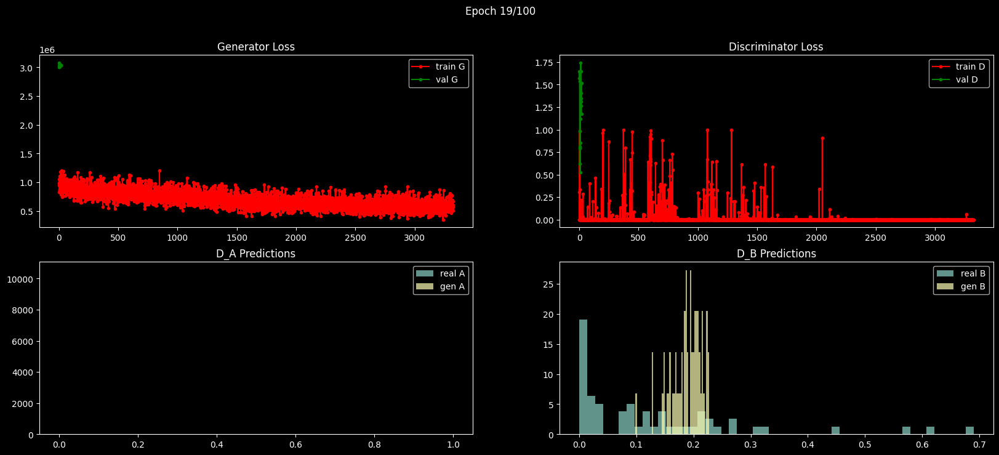

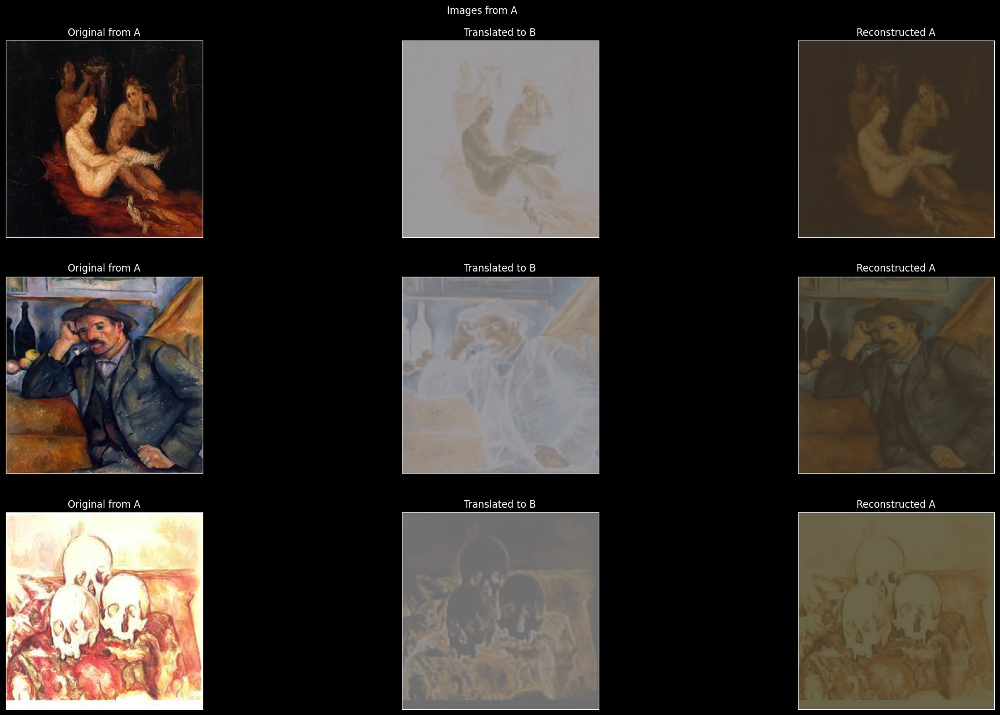

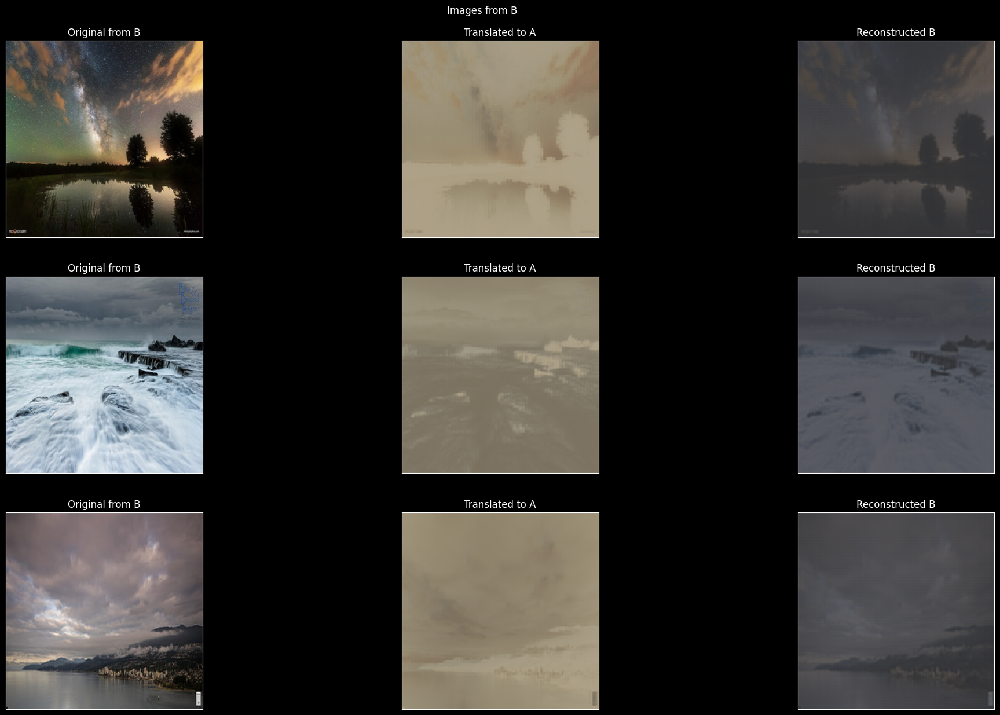

#20/100:


Epoch 20:   0%|          | 0/175 [00:00<?, ?it/s]

In [ ]:
%%time
model, optimizer_d, optimizer_g, plots = learning_loop(
    model = model,
    optimizer_g = optimizer_g,
    g_iters_per_epoch = 1,
    optimizer_d = optimizer_d,
    d_iters_per_epoch = 1,
    train_loader_a = dataloaders.train_a,
    train_loader_b = dataloaders.train_b,
    val_loader_a = dataloaders.test_a,
    val_loader_b = dataloaders.test_b,
    criterion_d = criterion_d,
    criterion_g = criterion_g,
    scheduler_g = scheduler_g,
    scheduler_d = scheduler_d,
    de_norm_a = de_normalize_a,
    de_norm_b = de_normalize_b,
    epochs = 100,
    min_lr = 1e-6,
    val_every = 1,
    draw_every = 1,
    chkp_folder = "./chkp",
    model_name = "cycle_gan",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
)